##### Copyright 2021 The TensorFlow Authors.    Modified by L. Grewe @2022

# **Image Classification with TensorFlow Lite Model Maker**


### In this colab notebook, you'll learn how to use the TensorFlow Lite Model Maker library to train a custom image classifer that can run a mobile device.

### It uses the[ Tensorflow Lite Model Maker API ](https://www.tensorflow.org/lite/models/modify/model_maker)
The [TensorFlow Lite Model Maker library](https://www.tensorflow.org/lite/models/modify/model_maker) simplifies the process of adapting and converting a TensorFlow neural-network model to particular input data when deploying this model for on-device ML applications.

This notebook shows an end-to-end example that utilizes this Model Maker library to illustrate the adaption and conversion of a commonly-used image classification model to classify flowers on a mobile device.


The Model Maker library uses transfer learning to simplify the process of training a TensorFlow Lite model using a custom dataset. Retraining a TensorFlow Lite model with your own custom dataset reduces the amount of training data required and will shorten the training time.

This colab is expecting the data to be already split into separate train, test and valid folders each containing subfolders - one per class. For example, in the classification of eyes for stroke patients we have the classes of normalEye, strokeEyeWeak, strokeEyeMid, strokeEyeSevere.  Hence the train and test and valid folders will contain the following sub-folders

*  test/normalEye
*  test/strokeEyeWeak
*  test/strokeEyeMid
*  test/strokeEyeSevere




#### **IMPORTANT:  TWO OPTIONS for training 1= from scratch and 2=from a checkpoint (i.e. if colab stopped and you had to restart training).    This will effect the following cells of evaluation and exporting.  NOTE: this is a work around because the Model Maker API does not yet support loading from checkpoints to train.   UNFORTUANTELY, this means that what happens is the underlying Object Detection API is used which requires a slightly different data input and all of this is prepared for you.**  

*   #### **BOTH options export and work in the default Model Maker Android app as shown in below in a screenshot (I tested it)**
*   #### **STEP 6 ONLY for OPTION 1 TRAINED FROM SCRATCH MODEL: If you trained from the checkpoint (option 2) then you can not evaluate the tflite model here in the colab (steps 6) only the model trained from scratch can (option 1) --because step 6 involves functionality that is only in the newer Model Maker model of Option1.**


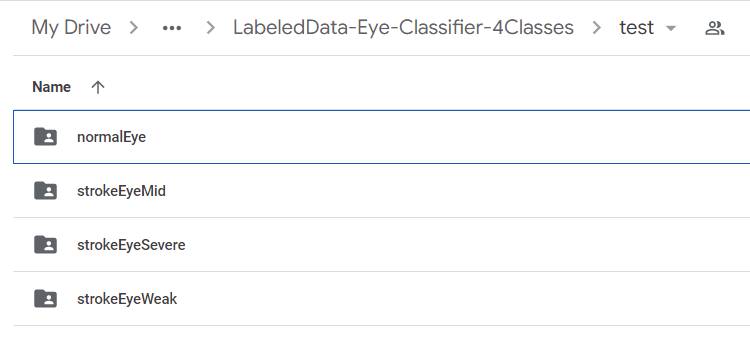

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# STEP 0: mount Drive and install libraries and import packages

### assumes data in drive/Mask/MaskDetect/data


Here you'll use the dataset given in the zip file (http://borg.csueastbay.edu/~grewe/CS663/Mat/TensorFlow/TensorFlowLiteModelMaker/data.zip).

*  grab the zip and unzip and upload the content to your drive in the path YOUDRIVE/Mask/MaskDetect

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)



Mounted at /content/drive


## Prerequisites


### Install the required packages
Start by installing the required packages, including the Model Maker package from the [GitHub repo](https://github.com/tensorflow/examples/tree/master/tensorflow_examples/lite/model_maker) and the pycocotools library you'll use for evaluation.



*   initially tested with tensorflow 2.8.0




In [ ]:
!pip install -q  tflite-model-maker
!sudo apt -y install libportaudio2

!pip install -q pycocotools
!pip install -q opencv-python-headless==4.1.2.30

# To write to word document install python-docx
!pip install python-docx

#!pip uninstall -y tensorflow && pip install -q tensorflow==2.8.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 577.3/577.3 KB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.9/238.9 KB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 KB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 59.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 KB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 84.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.9/840.9 KB 59.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.8/108.8 KB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 68.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 79.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.6/128.6 KB 17.0 MB/s eta

Import the required packages.

In [ ]:
import numpy as np
import os

from tflite_model_maker.config import QuantizationConfig
from tflite_model_maker.config import ExportFormat
from tflite_model_maker import model_spec
from tflite_model_maker import image_classifier
from tflite_model_maker.image_classifier import DataLoader



import matplotlib.pyplot as plt

import tensorflow as tf
assert tf.__version__.startswith('2')

tf.get_logger().setLevel('ERROR')
from absl import logging
logging.set_verbosity(logging.ERROR)


/usr/local/lib/python3.9/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.9.0 and strictly below 2.12.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.4 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


import numpy as np
import os

from tflite_model_maker.config import QuantizationConfig
from tflite_model_maker.config import ExportFormat
from tflite_model_maker import model_spec
from tflite_model_maker import object_detector

import tensorflow as tf
assert tf.__version__.startswith('2')

tf.get_logger().setLevel('ERROR')
from absl import logging
logging.set_verbosity(logging.ERROR)

#STEP 1: Load the data

In [ ]:
# setup the directory names

image_dir="drive/MyDrive/LabeledData-Eye-Classifier-4Classes"
print("image_dir\n")
print(image_dir)

test_dir="drive/MyDrive/LabeledData-Eye-Classifier-4Classes/test"
train_dir="drive/MyDrive/LabeledData-Eye-Classifier-4Classes/train"
valid_dir="drive/MyDrive/LabeledData-Eye-Classifier-4Classes/valid"


print(train_dir)
print(valid_dir)
print(test_dir)

%ls -1 {train_dir} | wc -l
%ls -1 {valid_dir} | wc -l
%ls -1 {test_dir} | wc -l

image_dir

drive/MyDrive/LabeledData-Eye-Classifier-4Classes
drive/MyDrive/LabeledData-Eye-Classifier-4Classes/train
drive/MyDrive/LabeledData-Eye-Classifier-4Classes/valid
drive/MyDrive/LabeledData-Eye-Classifier-4Classes/test
4
4
4


## load the train, test, valid DataLoaders

In [ ]:
#load the train, test, valid DataLoaders
train_data = DataLoader.from_folder(train_dir,shuffle=True)
test_data = DataLoader.from_folder(test_dir,shuffle=True)
validation_data = DataLoader.from_folder(valid_dir,shuffle=True)


tf.Tensor(
[[[136  87  55]
  [133  84  52]
  [128  81  51]
  ...
  [104  57  49]
  [103  56  48]
  [ 96  49  41]]

 [[134  85  53]
  [132  83  51]
  [129  82  52]
  ...
  [ 99  55  46]
  [102  55  47]
  [ 97  53  44]]

 [[133  84  54]
  [132  83  53]
  [130  83  55]
  ...
  [ 95  52  45]
  [ 97  52  46]
  [ 94  51  44]]

 ...

 [[146  99  83]
  [146  99  83]
  [143  97  82]
  ...
  [126  75  56]
  [130  79  58]
  [133  83  60]]

 [[142  95  79]
  [144  97  81]
  [142  94  80]
  ...
  [125  74  53]
  [128  77  56]
  [132  82  59]]

 [[144  95  80]
  [144  97  81]
  [140  92  78]
  ...
  [124  73  52]
  [127  76  55]
  [133  83  60]]], shape=(31, 70, 3), dtype=uint8)
tf.Tensor(
[[[ 57  51  53]
  [ 51  39  41]
  [ 61  36  39]
  ...
  [127  65  54]
  [111  54  43]
  [ 95  47  37]]

 [[ 55  49  49]
  [ 50  38  38]
  [ 59  35  35]
  ...
  [124  62  51]
  [110  53  44]
  [ 97  49  39]]

 [[ 54  46  44]
  [ 49  35  34]
  [ 52  28  26]
  ...
  [120  60  50]
  [107  53  43]
  [ 95  48  40]]

 ..

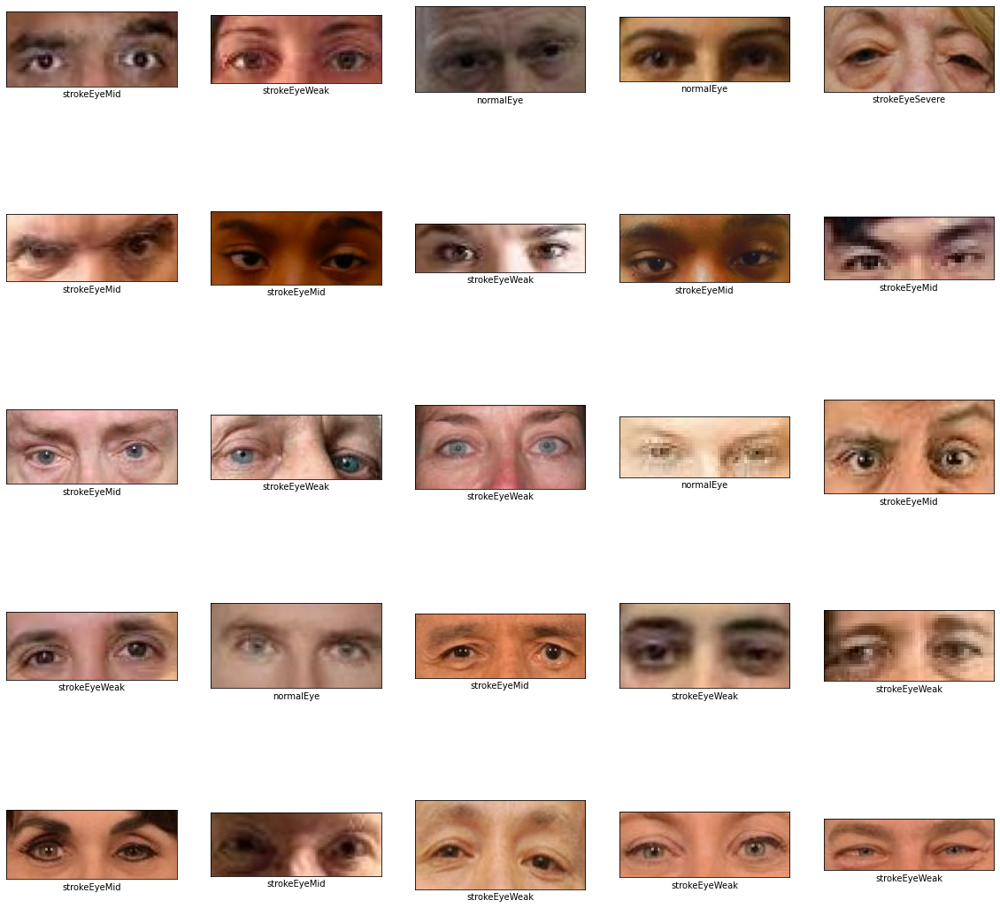

In [ ]:
plt.figure(figsize=(20,20))
for i, (image, label) in enumerate(test_data.gen_dataset().unbatch().take(25)):
  print(image)
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(image.numpy(), cmap=plt.cm.gray)
  plt.xlabel(test_data.index_to_label[label.numpy()])
plt.show()

#STEP2: setup &train the model which from modelmaker is EfficientNetB0 by default

### see documentation for [image_classifier.create](https://www.tensorflow.org/lite/api_docs/python/tflite_model_maker/image_classifier/create)




> `tflite_model_maker.image_classifier.create(
    train_data,
    model_spec='efficientnet_lite0',
    validation_data=None,
    batch_size=None,
    epochs=None,
    steps_per_epoch=None,
    train_whole_model=None,
    dropout_rate=None,
    learning_rate=None,
    momentum=None,
    shuffle=False,
    use_augmentation=False,
    use_hub_library=True,
    warmup_steps=None,
    model_dir=None,
    do_train=True
)`



##STEP 2 OPTION 1A - from loaded pre-trained model , retrain from scratch the whole model  --uses defaults see 

In [ ]:
#@title
#set number of epoch and batch_size to train and then train
# will retrain entire model
epochs = 5
batch_size = 20
model = image_classifier.create(train_data, batch_size=batch_size, train_whole_model=True, validation_data=validation_data, epochs=epochs)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hub_keras_layer_v1v2 (HubKe  (None, 1280)             3413024   
 rasLayerV1V2)                                                   
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 5)                 6405      
                                                                 
Total params: 3,419,429
Trainable params: 3,419,429
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/5
165/165 [==============================] - 29s 102ms/step - loss: 0.9909 - accuracy: 0.7055 - val_loss: 0.6956 - val_accuracy: 0.8638
Epoch 2/5
165/165 [==============================] - 17s 100ms/step - loss: 0.6779 - accuracy: 

##STEP 2 OPTION 1B - from loaded pretrained model, MODIFY SPECS, then train from scratch whole model

#### these are the spec options you can load...below loading EfficeintNetB0 = efficientnet_lite0

IMAGE_CLASSIFICATION_MODELS	['efficientnet_lite0','efficientnet_lite1','efficientnet_lite2','efficientnet_lite3','efficientnet_lite4','mobilenet_v2','resnet_50']

In [ ]:
#load EfficientNetB0 and alter the parameters
spec=model_spec.get('efficientnet_lite0')
#print(spec)

# for the classifier there does not seem to be a model_dir specified so can not use following (unlike the detector specs)
#spec.config.model_dir = "drive/MyDrive/iLab/Stroke/LabeledData-Eye-Classifier-4Classes/checkpoints"
# instead set the value to be used in the next block when call create to create the model
model_dir = "drive/MyDrive/LabeledData-Eye-Classifier-4Classes/checkpoints"



learning_rate=0.00005 #default is 0.08
#lr_warmup_init=0.0001
warmup_steps = 2 # default is 2 epochs

# THE OPTIONS below work for object_detector specs but do NOT for image_classifier in model maker
# some set above with paraemters to the image_classifier.create()
#OPTION to turn on verbosity
#spec.config.verbose = 1
#spec.config.learning_rate=0.001 #default is 0.08
#spec.config.lr_warmup_init=0.0001
#spec.config.lr_warup_epoch=10
#print(spec.config)

###  below does not save checkpoints as should

In [ ]:
#@title
#set number of epoch and batch_size to train and then train
# will retrain entire model
#DOES NOT SAVE CHECKPOINTS AS SHOULD
epochs = 100
batch_size = 20
model = image_classifier.create(train_data, batch_size=batch_size, train_whole_model=True, validation_data=validation_data, epochs=epochs, model_dir=model_dir,learning_rate=learning_rate, warmup_steps=warmup_steps)

###  **DOES  SAVE ONLY  1 checkpoints??????  after about 30-40 epochs then rewrites the file occasionally ---really confussed**

In [ ]:
#set number of epoch and batch_size to train and then train
# will retrain entire model
# NEED TO SPECIFY use_hub_library = False to get it to save checkpoints?
# NOTE IT IS SAVING CHECKPOINTS -- ONLY 1 and keeps overwriting rather than creating new ones???
epochs = 100
batch_size = 20
model = image_classifier.create(train_data, batch_size=batch_size, train_whole_model=True, validation_data=validation_data,use_hub_library=False, epochs=epochs, model_dir=model_dir,learning_rate=learning_rate, warmup_steps=warmup_steps)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hub_keras_layer_v1v2_2 (Hub  (None, 1280)             3413024   
 KerasLayerV1V2)                                                 
                                                                 
 dropout_2 (Dropout)         (None, 1280)              0         
                                                                 
 dense_2 (Dense)             (None, 4)                 5124      
                                                                 
Total params: 3,418,148
Trainable params: 3,418,148
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/100
31/31 [==============================] - 7s 108ms/step - loss: 1.4500 - accuracy: 0.3048 - val_loss: 1.3711 - val_accuracy: 0.3261
Epoch 2/100
31/31 [==============================] - 3s 95ms/step - loss: 1.3798 - accuracy: 0

# **STEP 3. Evaluate the model with the test data.**

After training the object detection model using the images in the training dataset evaluate how the model performs against new data it has never seen before.

As the default batch size is 64, it will take size_test_dataset/64 steps to go through the images in test dataset.

The evaluation metrics are same as [COCO](https://cocodataset.org/#detection-eval).

### **Use option 1 block below for trained from scratch model and option 2 below for model trained from a checkpoint to test --expects different data input on the pyhton model**

In [ ]:
#OPTION 1 for model trained from scratch
model.evaluate(test_data)

2/2 [==============================] - 0s 12ms/step - loss: 1.6177 - accuracy: 0.4510


[1.6177047491073608, 0.45098039507865906]

# **STEP 4.  Export as a TensorFlow Lite model: tflite and SavedModel**

Export the trained object detection model to the TensorFlow Lite format by specifying which folder you want to export the quantized model to. The default post-training quantization technique is full integer quantization.

### **Use option 1 block below for trained from scratch model and option 2 below for model trained from a checkpoint to export the model**

### **IMPORTANT You can download the TensorFlow Lite model file using the left sidebar of Colab. Right-click on the `model.tflite` file and choose `Download` to download it to your local computer.**

This model can be integrated into an Android or an iOS app using the [ObjectDetector API](https://www.tensorflow.org/lite/inference_with_metadata/task_library/object_detector) of the [TensorFlow Lite Task Library](https://www.tensorflow.org/lite/inference_with_metadata/task_library/overview).

See the [TFLite Object Detection sample app](https://github.com/tensorflow/examples/tree/master/lite/examples/object_detection/android) for more details on how the model is used in an working app.

*Note: Android Studio Model Binding does not support object detection yet so please use the TensorFlow Lite Task Library.*

In [ ]:
#OPTION 1A: for model trained from scratch to model.tflite
export_dir = "drive/MyDrive/LabeledData-Eye-Classifier-4Classes/exportLiteModel"
model.export(export_dir=export_dir,tflite_filename='model-200-0001.tflite')

/usr/local/lib/python3.9/dist-packages/tensorflow/lite/python/convert.py:746: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn("Statistics for quantized inputs were expected, but not "


In [ ]:
#OPTION 1B: for model trained from scratch to SAVED_MODEL format and also save the label file
export_dir = "drive/MyDrive/LabeledData-Eye-Classifier-4Classes/exportLiteModel"
model.export(export_dir=export_dir, export_format=[ExportFormat.SAVED_MODEL, ExportFormat.LABEL])

# **STEP 5.  Evaluate the TensorFlow Lite model from tflite file**
# **ONLY WORKS FOR MODELS TRAINED FROM SCRATCH (OPTION 1)**

Several factors can affect the model accuracy when exporting to TFLite:
* [Quantization](https://www.tensorflow.org/lite/performance/model_optimization) helps shrinking the model size by 4 times at the expense of some accuracy drop.
* The original TensorFlow model uses per-class [non-max supression (NMS)](https://www.coursera.org/lecture/convolutional-neural-networks/non-max-suppression-dvrjH) for post-processing, while the TFLite model uses global NMS that's much faster but less accurate.
Keras outputs maximum 100 detections while tflite outputs maximum 25 detections.

Therefore you'll have to evaluate the exported TFLite model and compare its accuracy with the original TensorFlow model.

In [ ]:
model_tflite_file = "drive/MyDrive/LabeledData-Eye-Classifier-4Classes/exportLiteModel/model-400.tflite"
model.evaluate_tflite(model_tflite_file, test_data)

{'accuracy': 0.5098039215686274}

#**STEP 6: Test the TFLite model on images**
We could plot the predicted results in 50 test images. Predicted labels with red color are the wrong predicted results while others are correct.

[[('strokeEyeMid', 0.54829913)], [('strokeEyeMid', 0.79232365)], [('normalEye', 0.8127684)], [('strokeEyeWeak', 0.9620922)], [('strokeEyeSevere', 0.478664)], [('strokeEyeWeak', 0.7656943)], [('strokeEyeMid', 0.8531694)], [('strokeEyeWeak', 0.7606972)], [('strokeEyeMid', 0.66143996)], [('strokeEyeMid', 0.8434643)], [('strokeEyeMid', 0.66776174)], [('strokeEyeSevere', 0.5081723)], [('strokeEyeWeak', 0.8271935)], [('normalEye', 0.8503468)], [('strokeEyeMid', 0.40877828)], [('strokeEyeMid', 0.48295185)], [('normalEye', 0.4682229)], [('strokeEyeWeak', 0.9410025)], [('strokeEyeMid', 0.7363726)], [('normalEye', 0.4658373)], [('strokeEyeMid', 0.8441804)], [('strokeEyeMid', 0.55788183)], [('strokeEyeWeak', 0.73318934)], [('strokeEyeWeak', 0.79229534)], [('strokeEyeMid', 0.69214034)], [('strokeEyeWeak', 0.49427885)], [('strokeEyeMid', 0.7461277)], [('strokeEyeMid', 0.6376264)], [('strokeEyeMid', 0.46496117)], [('strokeEyeMid', 0.73017585)], [('strokeEyeMid', 0.46947068)], [('strokeEyeMid', 0.739

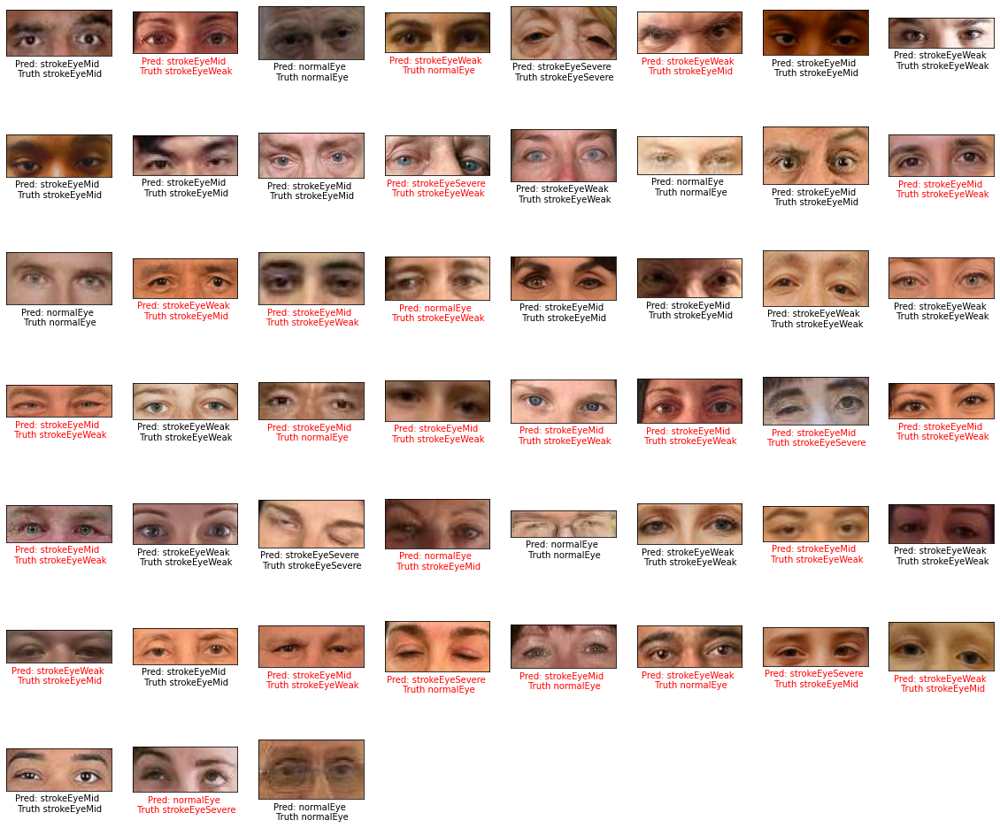

In [ ]:
# A helper function that returns 'red'/'black' depending on if its two input
# parameter matches or not.
def get_label_color(val1, val2):
  if val1 == val2:
    return 'black'
  else:
    return 'red'

# Then plot  100 test images and their predicted labels.
# If a prediction result is different from the label provided label in "test"
# dataset, we will highlight it in red color.
pred=[]
truth=[]
plt.figure(figsize=(20, 20))
predicts = model.predict_top_k(test_data)

print(predicts)
for i, (image, label) in enumerate(test_data.gen_dataset().unbatch().take(64)):
  ax = plt.subplot(8, 8, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(image.numpy(), cmap=plt.cm.gray)

  predict_label = predicts[i][0][0]
  color = get_label_color(predict_label,
                          test_data.index_to_label[label.numpy()])
  ax.xaxis.label.set_color(color)
  #plt.xlabel('Predicted: %s \n Truth %s',  predict_label, test_data.index_to_label[label.numpy()])
  plt.xlabel('Pred: %s \n Truth %s' % (predict_label, test_data.index_to_label[label.numpy()]))
  print(predict_label)
  truth.append(test_data.index_to_label[label.numpy()])
  pred.append(predict_label)
plt.show()

# **STEP 7: Run Tensorboard**

*   ## assumes tensorboard event files stored in drive as specified in path below


In [ ]:
#!ps -aef
#!netstat -ltnp | grep -w ':6006' 
!lsof -i :6006

COMMAND     PID USER   FD   TYPE DEVICE SIZE/OFF NODE NAME
tensorboa 21009 root   14u  IPv4 269684      0t0  TCP localhost:6006 (LISTEN)


In [ ]:
!kill 10171

In [ ]:
# Load the TensorBoard notebook extension
#%load_ext tensorboard
%reload_ext tensorboard
import datetime, os
#import tensorflow as tf  #already done above
logs = "drive/MyDrive/LabeledData-Eye-Classifier-4Classes/checkpoints"
#%cd $logs
#%tensorboard --logdir .
#%tensorboard --logdir logs
%tensorboard --logdir "drive/MyDrive/LabeledData-Eye-Classifier-4Classes/checkpoints/summaries"

Reusing TensorBoard on port 6006 (pid 10687), started 0:21:00 ago. (Use '!kill 10687' to kill it.)

<IPython.core.display.Javascript object>

['strokeEyeMid', 'strokeEyeWeak', 'normalEye', 'normalEye', 'strokeEyeSevere', 'strokeEyeMid', 'strokeEyeMid', 'strokeEyeWeak', 'strokeEyeMid', 'strokeEyeMid', 'strokeEyeMid', 'strokeEyeWeak', 'strokeEyeWeak', 'normalEye', 'strokeEyeMid', 'strokeEyeWeak', 'normalEye', 'strokeEyeMid', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeMid', 'strokeEyeMid', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'normalEye', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeSevere', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeSevere', 'strokeEyeMid', 'normalEye', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeMid', 'strokeEyeMid', 'strokeEyeWeak', 'normalEye', 'normalEye', 'normalEye', 'strokeEyeMid', 'strokeEyeMid', 'strokeEyeMid', 'strokeEyeSevere', 'normalEye']
['normalEye', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeWeak', 'strokeEyeSevere', 'normalEye', 'strokeEyeSevere', 'strokeEyeWeak', 'strokeEyeWea

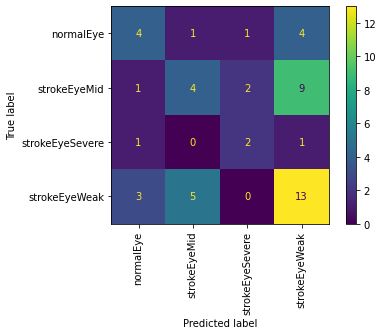

<Figure size 7200x7200 with 0 Axes>

In [ ]:
# Implement confusion matrix

import matplotlib.pyplot as plt
import numpy
from sklearn import metrics


print(truth)
print(pred)


confusion_matrix = metrics.confusion_matrix(truth, pred, normalize=None)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ["normalEye","strokeEyeMid","strokeEyeSevere","strokeEyeWeak"])


cm_display.plot()
plt.xticks(rotation=90)
plt.figure(figsize=(100, 100))
plt.show()

# **OLD STUFF BELOW**


---
--------------------------------------------------------------
-------------------------------------------------------------



## **SAFETY:  Validate IMAGES are JPEG, and if not attempt to convert**

In [ ]:
import glob
from PIL import Image
filepattern = images_dir + "/*"
print(filepattern)
files = glob.glob(filepattern)
len(files)
for file in files:
  if ".jpg" in file:
    image = Image.open(file)
    if image.format not in ["JPG", "JPEG"]:
      print (file)
      image.convert("RGB").save(file, "JPEG")
  else:
    print("file not jpg: ", file )

print("****************TRY AGAIN *************")
for file in files:
  if ".jpg" in file:
    image = Image.open(file)
    if image.format not in ["JPG", "JPEG"]:
      print (file)
  else:
    print("file not jpg: ", file )

/content/drive/MyDrive/iLab/Covid_ID/Mask/MaskDetect/data/images/*
****************TRY AGAIN *************


## **STEP 2(option3) TRAIN FROM PREVIOUS CHECKPOINT- to load weights from checkpoint directory and resume training** - uses the underlying Object Detection API rather than the Model Maker wrapper.

*   #### uses model spec defined above in Step 1.
*   #### reconfigures parameters so will load from latest checkpoint in checkpoint directory.
*   #### to do first calls image_classifier.create with do_train=False so doesnt train just setups up structure of model
*   ####  then has to change the data loader to using steps as will use the Image Classifier API rather than the outer model maker,  these are called below train_ds and validation_ds  
*   ####  Next alters the config of the model to use steps in training does this change in the train.setup(model,config) call belowand
*   #### Asks model to train using the dataloader train_ds in the call to model.fit




In [ ]:
#STEP 3(option2).1:  LOAD model from last stored checkpoint weights

#Import the same libs that TFLiteModelMaker interally uses
from tensorflow_examples.lite.model_maker.third_party.efficientdet.keras import train
from tensorflow_examples.lite.model_maker.third_party.efficientnet_lite0 import train
from tensorflow_examples.lite.model_maker.third_party.efficientnet_lite0.keras import train_lib

ModuleNotFoundError: ignored

#**below does NOT WORK becaue there is no third_party code for efficientnet  so no work around to load from check point and searches only have people complaining but, no solution**



*   https://discuss.tensorflow.org/t/tensor-flow-lite-model-maker-add-more-epochs-after-one-training-run/2720/10




In [ ]:
#STEP 3(option2).1:  LOAD model from last stored checkpoint weights

#Import the same libs that TFLiteModelMaker interally uses
from tensorflow_examples.lite.model_maker.third_party.efficientdet.keras import train
from tensorflow_examples.lite.model_maker.third_party.efficientdet.keras import train_lib

#checkpoints saved in model_dir
checkpoint_dir = model_dir #see above "drive/MyDrive/iLab/Stroke/LabeledData-Eye-Classifier-4Classes/checkpoints"
print(checkpoint_dir)

#set number of epoch and batch_size to train and then train
epochs = 14
batch_size = 8

#Create the object detector and NOTE do_train is false as we want to only load the architecture so below
# can load the model from weights rather than train from scratch
detector = image_classifier.create(train_data, 
                                model_spec=spec, 
                                batch_size=batch_size, 
                                train_whole_model=True, 
                                validation_data=validation_data,
                                epochs = epochs,
                                do_train = False
                                )   






#NOTE: From here on we use internal/"private" functions of the API,
# you can tell because the methods's names begin with an underscore
 

#Convert the datasets for training from a checkpoint specification which will use steps per epcoh 
train_ds, steps_per_epoch, _ = detector._get_dataset_and_steps(train_data, batch_size, is_training = True)
validation_ds, validation_steps, val_json_file = detector._get_dataset_and_steps(validation_data, batch_size, is_training = False)


#create the model from the above specified detector
model = detector.create_model()

#Copy what the API interally does as setup to use steps_per_epoch
config = spec.config
config.update(
    dict(
        steps_per_epoch=steps_per_epoch,
        eval_samples=batch_size * validation_steps,
        val_json_file=val_json_file,
        batch_size=batch_size
    )
)

train.setup_model(model, config) #This is the model.compile call basically so then can call model.fit below to train
model.summary()



#Find the last checkpoint in the checkpoint directory and load the weights
try:
  #Option A:
  #load the weights from the last successfully completed epoch
  latest = tf.train.latest_checkpoint(checkpoint_dir) 

  #Option B:
  #load the weights from a specific checkpoint
  #latest = specific_checkpoint_dir

  #determine the number of the last completed epoch
  completed_epochs = int(latest.split("/")[-1].split("-")[1]) #the epoch the training was at when the training was last interrupted
  model.load_weights(latest)

  print("Checkpoint found {}".format(latest))
  print("# completed epochs previously trained " + str(completed_epochs))
except Exception as e:
  print("Checkpoint not found: ", e)

/content/drive/MyDrive/iLab/Covid_ID/Mask/junk
Model: ""
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  multiple                  3234464   
                                                                 
 class_net/class-predict (Se  multiple                 2331      
 parableConv2D)                                                  
                                                                 
 box_net/box-predict (Separa  multiple                 2916      
 bleConv2D)                                                      
                                                                 
Total params: 3,239,711
Trainable params: 3,192,575
Non-trainable params: 47,136
_________________________________________________________________
Checkpoint found /content/drive/MyDrive/iLab/Covid_ID/Mask/junk/ckpt-5
# completed epochs previously trained 5


In [ ]:
#STEP 3(option2).2:  CONTINUE TRAINING FROM THE CHECKPOINT LOADED MODEL - from the completed_epochs out to # epochs 
print(train_data)

#Add callbacks that get executed at the end of every N 
#epochs: in this case I want to log the training results to tensorboard.
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=spec.config.model_dir, histogram_freq=1)
callbacks = train_lib.get_callbacks(config.as_dict(), validation_ds)
callbacks.append(tensorboard_callback)

callbacks.append(tensorboard_callback)
print(" callbacks = " + str(callbacks) +"\n\n")
print(" Tensorboard will log to " + str(spec.config.model_dir))


"""
Train the model 
"""
model.fit(
    # train_data,
    train_ds,   #as training with steps using fit function present data as train_ds rather than train_data as used in create() during train from scratch
    epochs=epochs,
    initial_epoch=completed_epochs, 
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_ds,
    validation_steps=validation_steps,
    callbacks=train_lib.get_callbacks(config.as_dict(), validation_ds) 
)


##SOUJANYA  --can you try this fix I don't think we were setting the updated callbacks for tensorboard.

In [ ]:
# CORRECTION??? FOR STEP 3.2  --previous cell

#STEP 3(option2).2:  CONTINUE TRAINING FROM THE CHECKPOINT LOADED MODEL - from the completed_epochs out to # epochs 
print(train_data)

#Add callbacks that get executed at the end of every N 
#epochs: in this case I want to log the training results to tensorboard.
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=spec.config.model_dir, histogram_freq=1)
callbacks2 = train_lib.get_callbacks(config.as_dict(), validation_ds)
callbacks2.append(tensorboard_callback)

callbacks2.append(tensorboard_callback)
print(" callbacks = " + str(callbacks) +"\n\n")
print(" Tensorboard will log to " + str(spec.config.model_dir))


"""
Train the model 
"""
model.fit(
    # train_data,
    train_ds,   #as training with steps using fit function present data as train_ds rather than train_data as used in create() during train from scratch
    epochs=epochs,
    initial_epoch=completed_epochs, 
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_ds,
    validation_steps=validation_steps,
    callbacks=callbacks2     # this is what changed from previous step
)

## **STEP 3(option3)** -**DOES NOT WORK** (keeping in case changes) but, noticed a commit on train method here that allows for an optional parameter  load_checkpoint_path.   Interesting it is in the commit



*   see [commit](https://github.com/tensorflow/examples/pull/368/commits/bd4bd79cbdc885e406b5a48b695a4352f127ed34) - after I asked about it them closed it saying not working!
*   read [conversation](https://github.com/tensorflow/examples/pull/368)
*   read [API for Model Maker ObjectDetection](https://www.tensorflow.org/lite/api_docs/python/tflite_model_maker/object_detector/ObjectDetector) --- NOTE it is NOT documented in the API but, seems to bee in the commit?????
*   this [is actual current code](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/lite/model_maker/core/task/object_detector.py)   there is NO load_checpoint_path parameter in the create() or train() functions.

In [ ]:
#option 3 code

#first create the model without asking to train , see do_train=False


#set number of epoch and batch_size to train and then train
epochs = 14
batch_size = 8

#checkpoints saved in model_dir
checkpoint_dir = spec.config.model_dir  #see above "/content/drive/MyDrive/iLab/Covid_ID/Mask/junk"
print(checkpoint_dir)


#Create the object detector and NOTE do_train is false as we want to only load the architecture so below
# can load the model from weights rather than train from scratch
detector = object_detector.create(train_data, 
                                model_spec=spec, 
                                batch_size=batch_size, 
                                train_whole_model=True, 
                                validation_data=validation_data,
                                epochs = epochs,
                                do_train = False
                                #load_checkpoint_path=checkpoint_dir
                                ) 






/content/drive/MyDrive/iLab/Covid_ID/Mask/junk


In [ ]:
#option 3 continued --can try to see if works instead in the train method

#set number of epoch and batch_size to train and then train
epochs = 7
batch_size = 8



# now going to try to call the train method to train it which has the load_checkpoint_path option
# it will return a model
'''
train(self,
            validation_data: Optional[
                object_detector_dataloader.DataLoader] = None,
            epochs: Optional[int] = None,
            batch_size: Optional[int] = None) -> tf.keras.Model:
            batch_size: Optional[int] = None,
            load_checkpoint_path: Optional[str] = None)
            '''

model = detector.train(train_data=train_data, validation_data=validation_data,epochs=epochs, batch_size=batch_size, load_checkpoint_path=checkpoint_dir)

TypeError: ignored

# **STEP 4. Evaluate the model with the test data.**

After training the object detection model using the images in the training dataset evaluate how the model performs against new data it has never seen before.

As the default batch size is 64, it will take size_test_dataset/64 steps to go through the images in test dataset.

The evaluation metrics are same as [COCO](https://cocodataset.org/#detection-eval).

### **Use option 1 block below for trained from scratch model and option 2 below for model trained from a checkpoint to test --expects different data input on the pyhton model**

In [ ]:
#OPTION 1 for model trained from scratch
model.evaluate(test_data)

2/2 [==============================] - 21s 8s/step - loss: 1.2994 - accuracy: 0.5098


[1.2994139194488525, 0.5098039507865906]

In [ ]:
#OPTOIN 2: For model trained from checkpoint
test_ds, test_steps, test_json_file = detector._get_dataset_and_steps(validation_data, batch_size, is_training = False)

model.evaluate(test_ds)

72/72 [==============================] - 25s 332ms/step - det_loss: 0.3819 - cls_loss: 0.2570 - box_loss: 0.0025 - reg_l2_loss: 0.0642 - loss: 0.4461


[0.0020768449176102877,
 0.2311747521162033,
 0.33501699566841125,
 0.39920878410339355,
 0.0641917884349823]

# **STEP 5.  Export as a TensorFlow Lite model.**

Export the trained object detection model to the TensorFlow Lite format by specifying which folder you want to export the quantized model to. The default post-training quantization technique is full integer quantization.

### **Use option 1 block below for trained from scratch model and option 2 below for model trained from a checkpoint to export the model**

### **IMPORTANT You can download the TensorFlow Lite model file using the left sidebar of Colab. Right-click on the `model.tflite` file and choose `Download` to download it to your local computer.**

This model can be integrated into an Android or an iOS app using the [ObjectDetector API](https://www.tensorflow.org/lite/inference_with_metadata/task_library/object_detector) of the [TensorFlow Lite Task Library](https://www.tensorflow.org/lite/inference_with_metadata/task_library/overview).

See the [TFLite Object Detection sample app](https://github.com/tensorflow/examples/tree/master/lite/examples/object_detection/android) for more details on how the model is used in an working app.

*Note: Android Studio Model Binding does not support object detection yet so please use the TensorFlow Lite Task Library.*

In [ ]:
#OPTION 1: for model trained from scratch
export_dir = "drive/MyDrive/iLab/Stroke/LabeledData-Eye-Classifier-4Classes/exportLiteModel"
model.export(export_dir=export_dir)

/usr/local/lib/python3.9/dist-packages/tensorflow/lite/python/convert.py:746: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn("Statistics for quantized inputs were expected, but not "


## IMPORTANT: **For saving model trained from checkpoint must use code below** I have tested for the OPTION 2 model trained from checkpoint the exported TFLite does function properly for the default Android Model Maker application (as of 2022 when this was created).

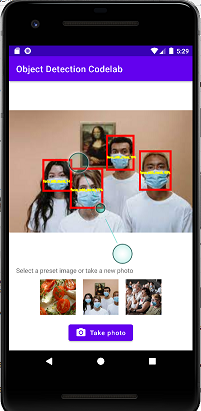

In [ ]:
#OPTION 2: for model trained from checkpoint

"""
Save/export the trained model
Tip: for integer quantization you simply have to NOT SPECIFY 
the quantization_config parameter of the detector.export method
"""
quant_config = QuantizationConfig.for_float16() #or whatever quantization you want
detector.model = model #inject our trained model into the object detector
detector.export(export_dir = data_dir, tflite_filename='model.tflite', quantization_config = quant_config)




### Export to different formats

The export formats can be one or a list of the following:

*   `ExportFormat.TFLITE`
*   `ExportFormat.LABEL`
*   `ExportFormat.SAVED_MODEL`




By default, it exports only the TensorFlow Lite model file containing the model [metadata](https://www.tensorflow.org/lite/models/convert/metadata) so that you can later use in an on-device ML application. The label file is embedded in metadata.

In many on-device ML application, the model size is an important factor. Therefore, it is recommended that you quantize the model to make it smaller and potentially run faster. As for EfficientDet-Lite models, full integer quantization  is used to quantize the model by default. Please refer to [Post-training quantization](https://www.tensorflow.org/lite/performance/post_training_quantization) for more detail.

```python
model.export(export_dir='.')
```

You can also choose to export other files related to the model for better examination. For instance, exporting both the saved model and the label file as follows:
```python
model.export(export_dir='.', export_format=[ExportFormat.SAVED_MODEL, ExportFormat.LABEL])
```

### Customize Post-training quantization on the TensorFlow Lite model

[Post-training quantization](https://www.tensorflow.org/lite/performance/post_training_quantization) is a conversion technique that can reduce model size and inference latency, while also improving CPU and hardware accelerator inference speed, with a little degradation in model accuracy. Thus, it's widely used to optimize the model.

Model Maker library applies a default post-training quantization techique when exporting the model. If you want to customize post-training quantization, Model Maker supports multiple post-training quantization options using [QuantizationConfig](https://www.tensorflow.org/lite/api_docs/python/tflite_model_maker/config/QuantizationConfig) as well. Let's take float16 quantization as an instance. First, define the quantization config.

```python
config = QuantizationConfig.for_float16()
```


Then we export the TensorFlow Lite model with such configuration.

```python
model.export(export_dir='.', tflite_filename='model_fp16.tflite', quantization_config=config)
```

# Read more

You can read our [object detection](https://www.tensorflow.org/lite/examples/object_detection/overview) example to learn technical details. For more information, please refer to:

*   TensorFlow Lite Model Maker [guide](https://www.tensorflow.org/lite/models/modify/model_maker) and [API reference](https://www.tensorflow.org/lite/api_docs/python/tflite_model_maker).
*   Task Library: [ObjectDetector](https://www.tensorflow.org/lite/inference_with_metadata/task_library/object_detector) for deployment.
*   The end-to-end reference apps: [Android](https://github.com/tensorflow/examples/tree/master/lite/examples/object_detection/android), [iOS](https://github.com/tensorflow/examples/tree/master/lite/examples/object_detection/ios), and [Raspberry PI](https://github.com/tensorflow/examples/tree/master/lite/examples/object_detection/raspberry_pi).

